Nishank Dave

#MIT License
Copyright (c) 2023 Nishank Dave

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

#Abstract:
This dataset about Walmart.

#Aim:
In this assignment we aim to interpret the results of

*Linear Model

*Tree Based Model

*Best model of AutoML H2O

*Using different Model Interpretibility Methods.



In [57]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install -U scikit-learn
!pip install probatus==1.7.0
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o
!pip install PartialDependenceDisplay

import pandas as pd
import numpy as np
import shap
import lime
from lime import lime_tabular
import sklearn
from sklearn.model_selection import train_test_split
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in

In [58]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [59]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

3


In [60]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)
     

Checking whether there is an H2O instance running at http://localhost:18466..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp8om042v2
  JVM stdout: /tmp/tmp8om042v2/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp8om042v2/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:18466
Connecting to H2O server at http://127.0.0.1:18466 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_jmsr0i
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [61]:
url = 'https://raw.githubusercontent.com/Nishank-NEU/Data-Science/main/walmartSample.csv'
df = pd.read_csv(url, encoding='unicode_escape')  # Reading CSV file into Pandas DataFrame

In [62]:
df.describe()

,Unnamed: 0,X,Store,Dept,Weekly_Sales,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,170.000000,125.000000,155.000000,154.000000,172.000000,500.000000,500.000000,500.000000
mean,210530.526000,210530.526000,22.130000,43.566000,15464.517940,60.834100,3.355510,7078.752294,2412.817120,3460.453806,3067.436818,4762.213488,170.958683,7.856342,133242.576000
std,123953.839618,123953.839618,13.018451,30.151416,22670.486915,18.007267,0.467349,7321.494836,5563.719396,14725.582805,5514.412473,4503.031418,38.966870,1.705760,61115.483536
min,309.000000,309.000000,1.000000,1.000000,0.990000,6.230000,2.514000,0.270000,-0.910000,-0.870000,1.500000,170.640000,126.064000,4.125000,34875.000000
25%,106939.000000,106939.000000,11.000000,19.000000,2054.230000,47.990000,2.909000,2698.030000,65.000000,4.420000,554.447500,1978.842500,132.106200,6.887500,93188.000000
50%,208623.500000,208623.500000,22.000000,36.000000,6990.795000,63.130000,3.448500,5566.535000,197.720000,25.940000,1432.550000,3507.195000,182.386625,7.796500,128107.000000
75%,312257.000000,312257.000000,32.000000,71.250000,18760.335000,74.160000,3.743250,8673.122500,1163.890000,143.420000,3466.392500,6113.865000,211.957725,8.515000,202505.000000
max,422277.000000,422277.000000,45.000000,99.000000,225156.090000,94.870000,4.468000,53423.290000,30876.790000,83340.330000,57817.560000,28238.930000,227.214288,14.313000,219622.000000


In [63]:
df.info()
numeric_df = df.select_dtypes(include=[np.number])
categorical_df = df.select_dtypes(exclude=[np.number])
numeric_df.shape[1]
categorical_df.shape[1]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    500 non-null    int64  
 1   X             500 non-null    int64  
 2   Store         500 non-null    int64  
 3   Date          500 non-null    object 
 4   IsHoliday     500 non-null    bool   
 5   Dept          500 non-null    int64  
 6   Weekly_Sales  500 non-null    float64
 7   Temperature   500 non-null    float64
 8   Fuel_Price    500 non-null    float64
 9   MarkDown1     170 non-null    float64
 10  MarkDown2     125 non-null    float64
 11  MarkDown3     155 non-null    float64
 12  MarkDown4     154 non-null    float64
 13  MarkDown5     172 non-null    float64
 14  CPI           500 non-null    float64
 15  Unemployment  500 non-null    float64
 16  Type          500 non-null    object 
 17  Size          500 non-null    int64  
dtypes: bool(1), float64(10), int64

3

In [64]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split

In [65]:
df[['MarkDown1','MarkDown2','MarkDown3','MarkDown4', 'MarkDown5']] = df[['MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5']].fillna(0)
df['Year'] = pd.to_datetime(df['Date']).dt.year
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Week'] = pd.to_datetime(df['Date']).dt.isocalendar().week
X = df.drop(columns=["Date", "CPI", "Fuel_Price", 'Unemployment', 'Temperature'])
Y = df['Weekly_Sales']  # Target

In [66]:
data = df.pop('Weekly_Sales')
df['Weekly_Sales'] = data
df

,Unnamed: 0,X,Store,Date,IsHoliday,Dept,Temperature,Fuel_Price,MarkDown1,MarkDown2,...,MarkDown4,MarkDown5,CPI,Unemployment,Type,Size,Year,Month,Week,Weekly_Sales
0,202017,202017,21,2011-02-25,False,36,61.27,3.065,0.00,0.00,...,0.00,0.00,213.190421,8.028,B,140167,2011,2,8,1025.00
1,165520,165520,17,2012-03-02,False,31,26.28,3.242,14469.08,1163.89,...,8771.30,2237.79,130.645793,6.403,B,93188,2012,3,9,1236.64
2,389207,389207,41,2011-12-02,False,94,34.53,3.378,4594.56,305.47,...,3168.10,21739.26,195.822329,6.759,A,196321,2011,12,48,37971.00
3,133193,133193,14,2011-05-06,False,67,58.21,4.046,0.00,0.00,...,0.00,0.00,185.937438,8.521,A,200898,2011,5,18,26400.02
4,401356,401356,43,2010-10-08,False,1,72.81,2.633,0.00,0.00,...,0.00,0.00,203.665179,10.210,C,41062,2010,10,40,8748.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,172845,172845,18,2011-06-10,False,36,69.49,3.924,0.00,0.00,...,0.00,0.00,134.942548,8.975,B,120653,2011,6,23,5338.50
496,154839,154839,16,2011-12-02,False,4,27.83,3.378,516.47,61.00,...,9.00,7124.75,195.822329,6.232,B,57197,2011,12,48,13876.12
497,197058,197058,20,2012-06-29,False,48,74.15,3.506,6569.40,605.70,...,561.31,4567.03,214.646676,7.139,A,203742,2012,6,26,1034.00
498,149126,149126,16,2010-04-02,False,18,36.19,2.725,0.00,0.00,...,0.00,0.00,189.704822,6.842,B,57197,2010,4,13,3943.81


In [67]:
df.isnull().sum()

Unnamed: 0      0
X               0
Store           0
Date            0
IsHoliday       0
Dept            0
Temperature     0
Fuel_Price      0
MarkDown1       0
MarkDown2       0
MarkDown3       0
MarkDown4       0
MarkDown5       0
CPI             0
Unemployment    0
Type            0
Size            0
Year            0
Month           0
Week            0
Weekly_Sales    0
dtype: int64

**Fitting a Linear Model**

In [68]:
y = df['Weekly_Sales']
X = df.drop(['Weekly_Sales'], axis = 1)

In [69]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

In [70]:
from sklearn.model_selection import  train_test_split

X = df[ ['Store', 'Dept','Size', 'Year', 'Month']].replace(',', '', regex = True).astype(float)

y = df['Weekly_Sales']

#Spliting data into Training set, Validation set and Test set 20%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_t, y_t, test_size=0.15, random_state=1)

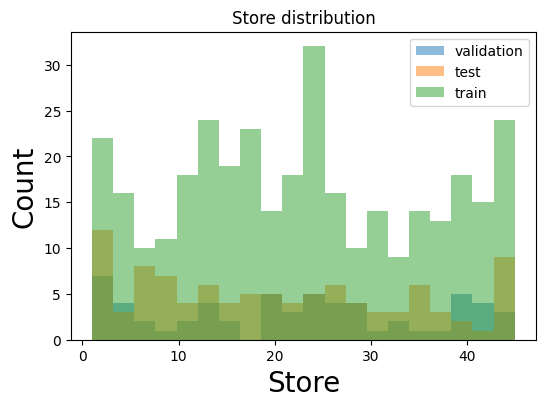

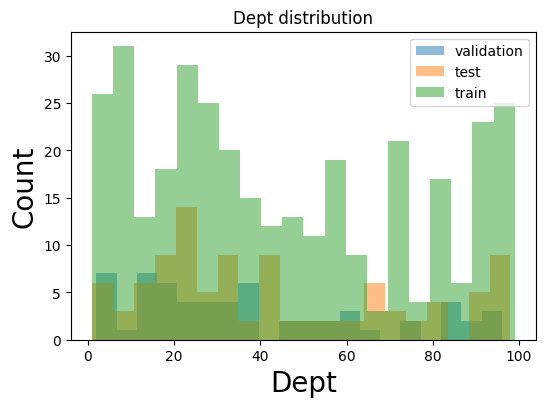

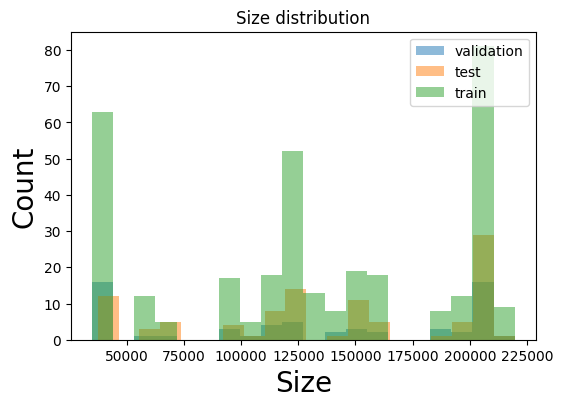

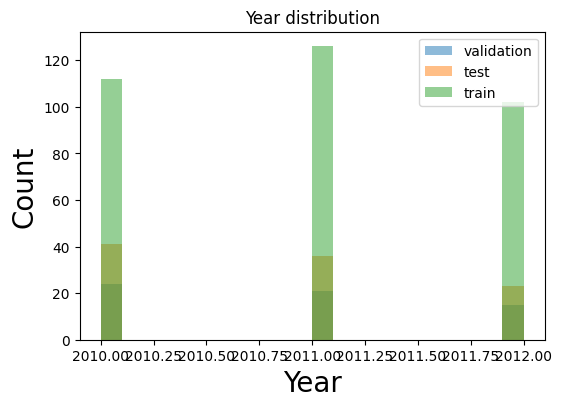

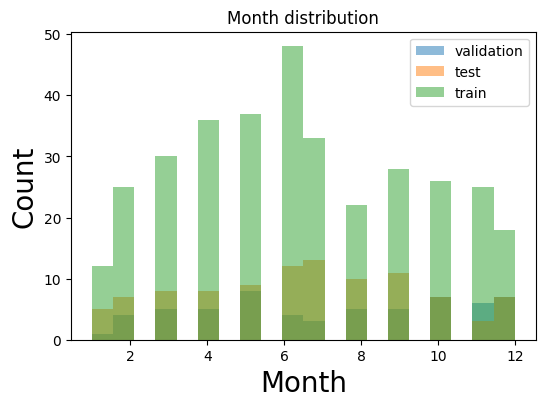

In [71]:
# Looking the data for test, training and validation set
X_test_plot = X_test[['Store', 'Dept','Size', 'Year', 'Month']]

X_val_plot = X_val[['Store', 'Dept','Size', 'Year', 'Month']]

X_train_plot = X_train[['Store', 'Dept','Size', 'Year', 'Month']]

# Plotting the data to see the histogram
import matplotlib.pyplot as plt
for c in X_test_plot.columns:
  fig, ax = plt.subplots(figsize=(6,4))
  ax.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
  ax.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
  ax.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
  ax.set_xlabel(c, size=20)
  ax.set_ylabel("Count", size=20)
  ax.legend(loc='upper right')
  ax.set_title("{} distribution".format(c))
  plt.show()

In [72]:
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train,y_train)

LinearRegression()

In [73]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(df['Weekly_Sales'], df[['Store', 'Dept','Size', 'Year', 'Month']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:           Weekly_Sales   R-squared (uncentered):                   0.382
Model:                            OLS   Adj. R-squared (uncentered):              0.376
Method:                 Least Squares   F-statistic:                              61.20
Date:                Wed, 29 Mar 2023   Prob (F-statistic):                    1.29e-49
Time:                        21:57:49   Log-Likelihood:                         -5698.7
No. Observations:                 500   AIC:                                  1.141e+04
Df Residuals:                     495   BIC:                                  1.143e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Store       -139.5917     76.249     -1.831      0.068    -289.402      10.219
Dept          65.7827     32.241      2.040      0.042       2.437     129.128
Size           0.0897      0.016      5.520      0.000       0.058       0.122
Year          -0.5920      1.876     -0.316      0.752      -4.279       3.094
Month        755.0849    316.030      2.389      0.017     134.159    1376.011
==============================================================================
Omnibus:                      396.554   Durbin-Watson:                   1.938
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             8676.288
Skew:                           3.295   Prob(JB):                         0.00
Kurtosis:                      22.314   Cond. No.                     4.78e+04
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 4.78e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

    Y_Predictions  Y_actual
4    16434.280962   8748.54
5    17786.777857   8258.50
6    22811.449873   4054.58
11    8156.986884   1660.85
17   20624.980643   2545.00
29   25803.290414   9979.58
31    9372.044716     20.24
34   21482.799069  14558.19
47   10793.418552  13155.08
62   17194.737827  18910.84
65   18931.666233   3331.97
66   11888.542301   2082.30
67   21323.906551   2325.41
85   23242.553777  34783.93
90   20403.443534    312.05
92   21687.768212     21.08
The mean squared error is: 185740731.18940273
The R^2 score on train data is: 0.07520676860642095
  ColumnNames  Coefficients
0       Store   -147.298397
1        Dept     68.888265
2        Size      0.080736
3        Year  -1168.085845
4       Month    534.809373


<Axes: >

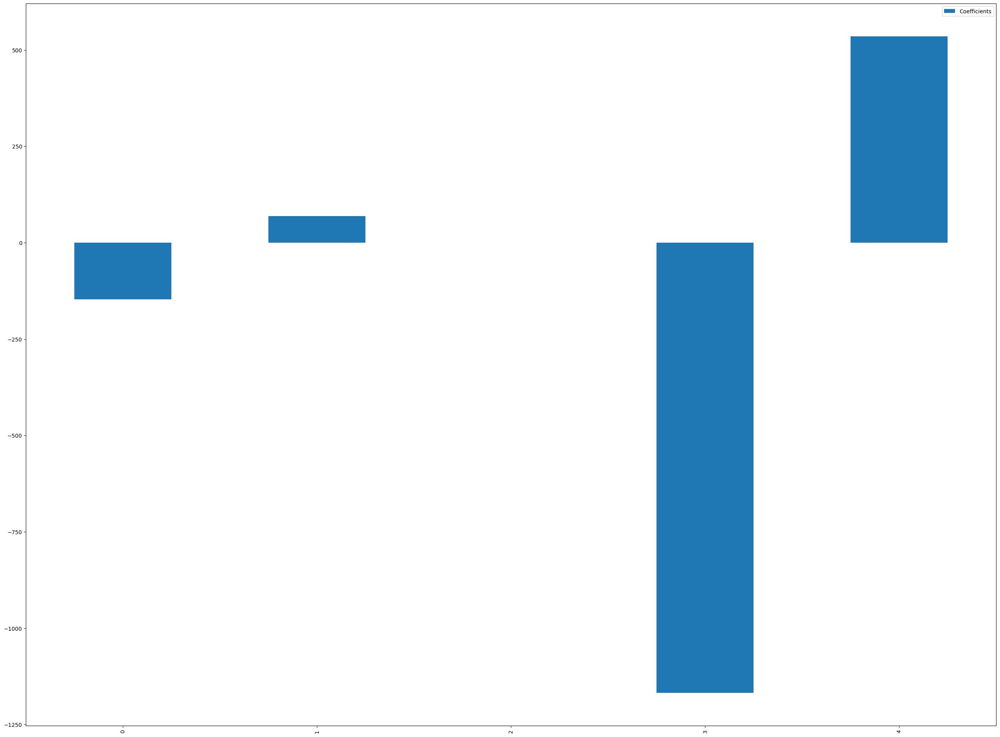

In [74]:
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
Linear_regression = LinearRegression().fit(X_train, y_train)
y_prediction = Linear_regression.predict(X_test)
coeff = Linear_regression.coef_
analysis = pd.DataFrame()
analysis['Y_Predictions'] = y_prediction
analysis['Y_actual'] = y_test
analysis = analysis.dropna()
print(analysis)
#sns.residplot(x = analysis['Y_actual'], y = analysis['Y_Predictions'])
pad = pd.DataFrame()
pad['ColumnNames'] = X_train.columns
pad['Coefficients'] = coeff
print("The mean squared error is: {}".format(mean_squared_error(analysis['Y_actual'], analysis['Y_Predictions'])))
print("The R^2 score on train data is: {}".format(Linear_regression.score(X_train, y_train)))
print(pad)
pad.plot.bar()

     Y_Predictions  Y_actual
1     35134.873443    1236.0
2     20990.500130   37971.0
3     11347.925319   26400.0
4     16685.276000    8748.0
7     11973.799952    8091.0
..             ...       ...
369   15899.322537   11161.0
370    5355.361467    7194.0
371   34578.770247    2647.0
373    2470.265735    6273.0
374    7130.907577   29768.0

[285 rows x 2 columns]
[ 1.84137562e+01  1.23842324e+02  7.86348813e-02 -4.13176446e+03
  1.87599600e+03]
  ColumnNames  Coefficients
0       Store     18.413756
1        Dept    123.842324
2        Size      0.078635
3        Year  -4131.764456
4       Month   1875.995999
The mean squared error is: 650799873.5100051
The R^2 score on train data is: 0.13156342743979643
  ColumnNames  Coefficients
0       Store     18.413756
1        Dept    123.842324
2        Size      0.078635
3        Year  -4131.764456
4       Month   1875.995999


<Axes: >

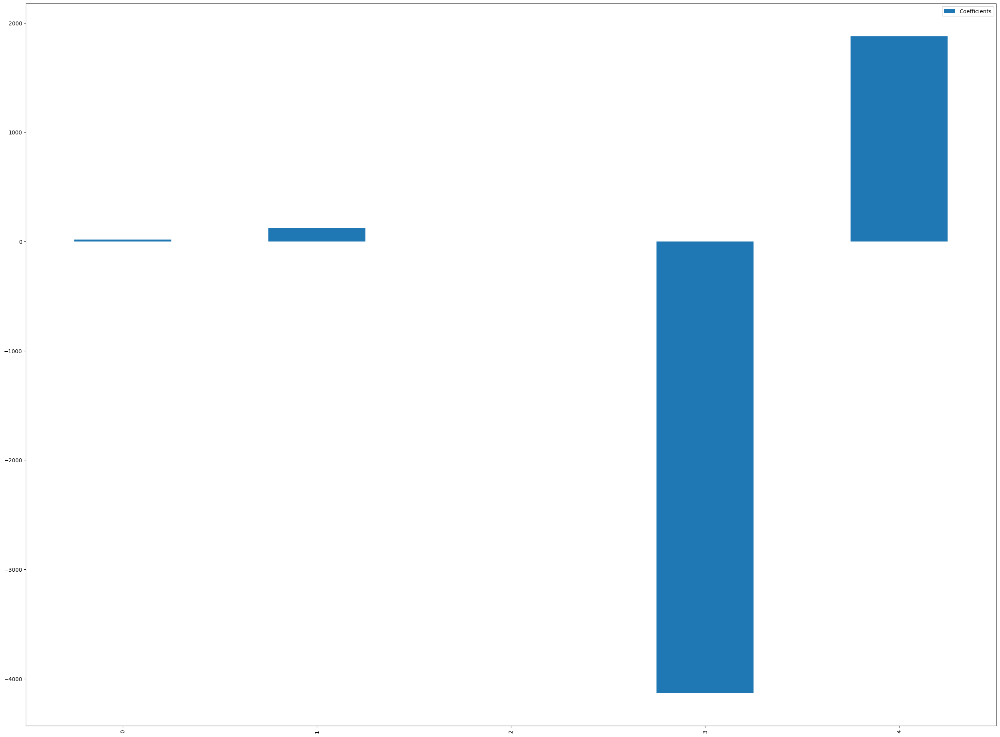

In [75]:
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

df = df[['Store', 'Dept', 'Size', 'Weekly_Sales', 'Year', 'Month']].replace(',', '', regex = True).astype(int)

x = df.drop(['Weekly_Sales'], axis = 1)
y = df.Weekly_Sales
x_train, x_test, y_train, y_test = train_test_split(x,y,train_size=0.25,shuffle = True)

# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(x_train,y_train)
regr.coef_

analysis = pd.DataFrame()
analysis['Y_Predictions'] = regr.predict(x_test)
analysis['Y_actual'] = y_test
analysis = analysis.dropna()
print(analysis)

print(regr.coef_)
#ax = x_train.plot.bar(y = lregr.coef_)
pad = pd.DataFrame()
pad['ColumnNames'] = x_train.columns.values
pad['Coefficients'] = regr.coef_

print(pad)


print("The mean squared error is: {}".format(mean_squared_error(analysis['Y_actual'], analysis['Y_Predictions'])))
print("The R^2 score on train data is: {}".format(regr.score(x_train, y_train)))
print(pad)
pad.plot.bar()






#Fitting A Tree Based Model


     Y_Predictions  Y_actual
1     15774.000000    1236.0
2     36981.000000   37971.0
3     17735.500000   26400.0
4     16682.000000    8748.0
7     17735.500000    8091.0
..             ...       ...
369    5643.250000   11161.0
370     537.000000    7194.0
371   16682.000000    2647.0
373     537.000000    6273.0
374    8449.741935   29768.0

[285 rows x 2 columns]
The mean squared error is: 989225052.5188391
The R^2 score on train data is: 0.13156342743979643
[4.80000000e+01 1.57740000e+04 3.69810000e+04 1.77355000e+04
 1.66820000e+04 3.04680000e+04 1.57740000e+04 1.77355000e+04
 2.51590000e+04 2.49150000e+03 5.69450000e+04 1.77355000e+04
 5.69450000e+04 4.80000000e+01 1.52000000e+02 2.25750000e+02
 8.00333333e+02 1.76800000e+03 1.10000000e+01 5.49900000e+03
 8.44974194e+03 8.44974194e+03 4.57866667e+03 4.80000000e+01
 6.81500000e+03 8.44974194e+03 8.44974194e+03 2.25750000e+02
 8.44974194e+03 1.77355000e+04 8.44974194e+03 1.77355000e+04
 1.09720000e+04 8.44974194e+03 1.77355000e+

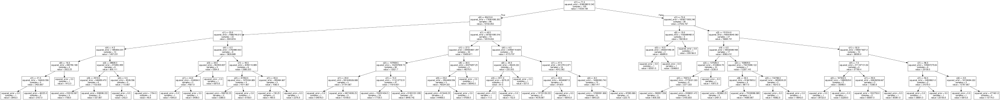

In [76]:
from sklearn import tree
import graphviz

regressor = tree.DecisionTreeRegressor(random_state=1, max_depth=6)
regressor = regressor.fit(x_train, y_train)
predictions = regressor.predict(x_test)
analysis = pd.DataFrame()
analysis['Y_Predictions'] = predictions
analysis['Y_actual'] = y_test
analysis = analysis.dropna()
print(analysis)

print("The mean squared error is: {}".format(mean_squared_error(analysis['Y_actual'], analysis['Y_Predictions'])))
print("The R^2 score on train data is: {}".format(regr.score(x_train, y_train)))
explainer = shap.TreeExplainer(regressor)
shap_values_decision_tree = explainer.shap_values(x_test)
#shap.summary_plot(shap_values_decision_tree, x_test, plot_type="bar")

predictions = regressor.predict(x_test)
print(predictions)

### Visualizing the decision tree graph.
dot_data = tree.export_graphviz(regressor, out_file=None)
graph = graphviz.Source(dot_data)
graph

In [77]:
# Get numerical feature importances
tree_importances = list(regressor.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(X_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [78]:
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Dept                 Importance: 0.55
Variable: Store                Importance: 0.29
Variable: Size                 Importance: 0.13
Variable: Month                Importance: 0.03
Variable: Year                 Importance: 0.0


#AutoML

In [79]:
hf = h2o.H2OFrame(df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [80]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = hf.split_frame([pct_rows])


In [81]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "Weekly_Sales"

    X.remove(y)  # Removing the result frm our predictors data
    
    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml


# Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model
     

In [82]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [83]:
autoML[2].leaderboard 

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
GBM_5_AutoML_1_20230329_215753,18336.4,3.36223e+08,10422.7,nan,3.36223e+08
StackedEnsemble_AllModels_6_AutoML_1_20230329_215753,18420.7,3.39324e+08,10408.1,nan,3.39324e+08
StackedEnsemble_BestOfFamily_6_AutoML_1_20230329_215753,18440.1,3.40036e+08,10370.9,nan,3.40036e+08
StackedEnsemble_BestOfFamily_4_AutoML_1_20230329_215753,18460.6,3.40793e+08,10346.7,nan,3.40793e+08
StackedEnsemble_AllModels_5_AutoML_1_20230329_215753,18471.3,3.41188e+08,10176.3,nan,3.41188e+08
StackedEnsemble_AllModels_3_AutoML_1_20230329_215753,18578.4,3.45157e+08,10523.3,nan,3.45157e+08
GBM_grid_1_AutoML_1_20230329_215753_model_33,18602.8,3.46063e+08,10837,nan,3.46063e+08
StackedEnsemble_BestOfFamily_3_AutoML_1_20230329_215753,18663.4,3.48323e+08,10347.9,nan,3.48323e+08
GBM_grid_1_AutoML_1_20230329_215753_model_41,18731.2,3.50857e+08,10817.9,nan,3.50857e+08
GBM_grid_1_AutoML_1_20230329_215753_model_21,18784.3,3.52851e+08,10815.2,nan,3.52851e+08


In [84]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

0
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_5_AutoML_1_20230329_215753


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    44                 44                          28043                  6            6            6             28            55            46.0909

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 21557118.57314701
RMSE: 4642.964416528196
MAE: 3211.877504557447
RMSLE: NaN
Mean Residual Deviance: 21557118.57314701

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 336222974.79948896
RMSE: 18336.383907398125
MAE: 10422.726397491446
RMSLE: NaN
Mean Residual Deviance: 336222974.79948896

Cross-Validation Metrics 

In [85]:
autoML_model.predict

<bound method ModelBase.predict of H2OGradientBoostingEstimator({'parms': {'model_id': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'model_id', 'label': 'model_id', 'help': 'Destination id for this model; auto-generated if not specified.', 'required': False, 'type': 'Key<Model>', 'default_value': None, 'actual_value': {'__meta': {'schema_version': 3, 'schema_name': 'ModelKeyV3', 'schema_type': 'Key<Model>'}, 'name': 'GBM_5_AutoML_1_20230329_215753', 'type': 'Key<Model>', 'URL': '/3/Models/GBM_5_AutoML_1_20230329_215753'}, 'input_value': None, 'level': 'critical', 'values': [], 'is_member_of_frames': [], 'is_mutually_exclusive_with': [], 'gridable': False}, 'training_frame': {'__meta': {'schema_version': 3, 'schema_name': 'ModelParameterSchemaV3', 'schema_type': 'Iced'}, 'name': 'training_frame', 'label': 'training_frame', 'help': 'Id of the training data frame.', 'required': False, 'type': 'Key<Frame>', 'default_value': None,

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

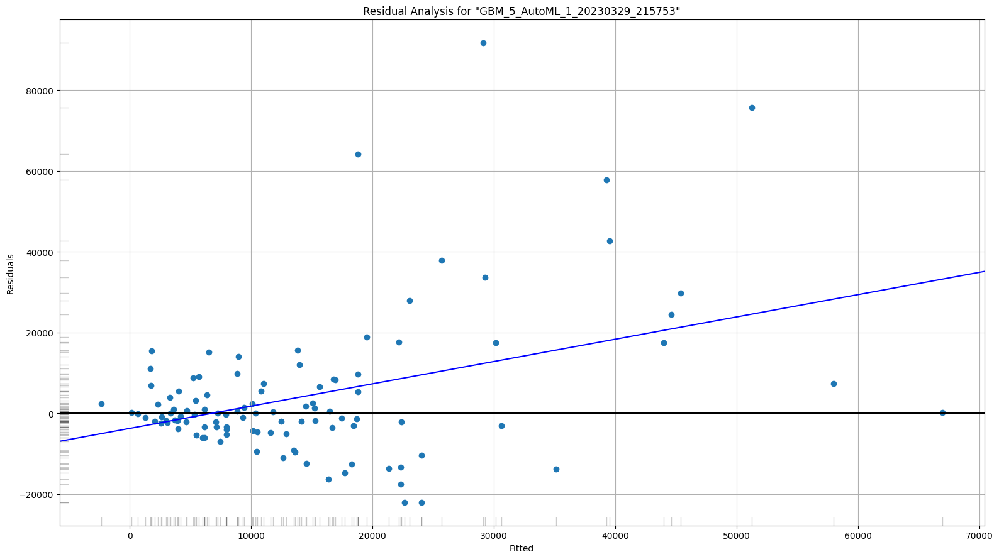

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

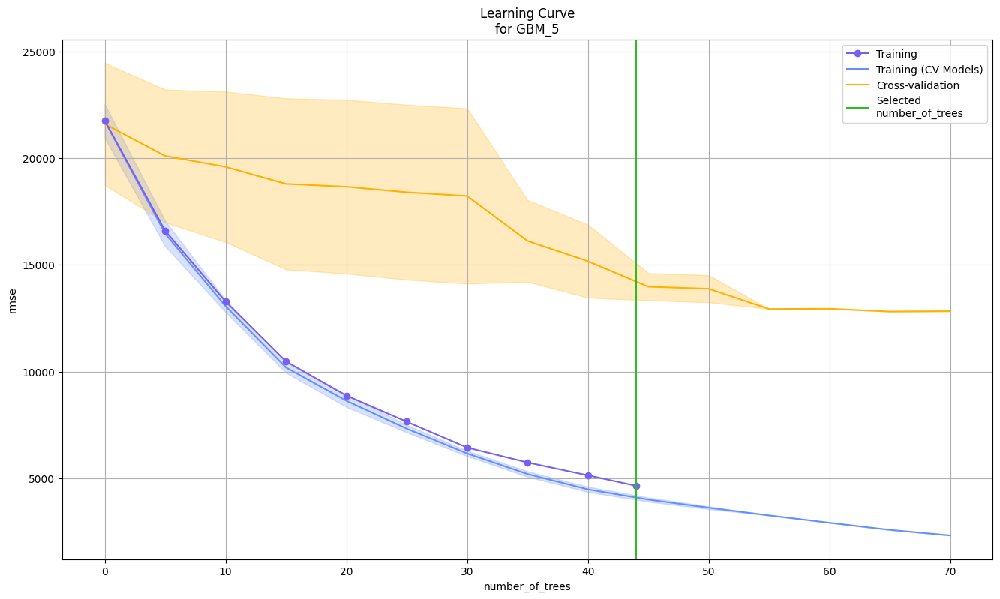

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

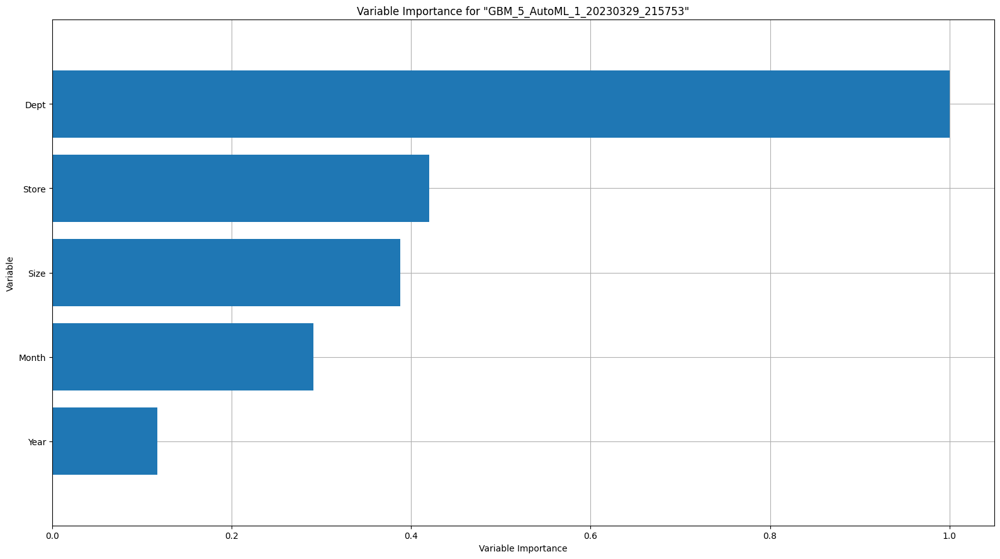

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

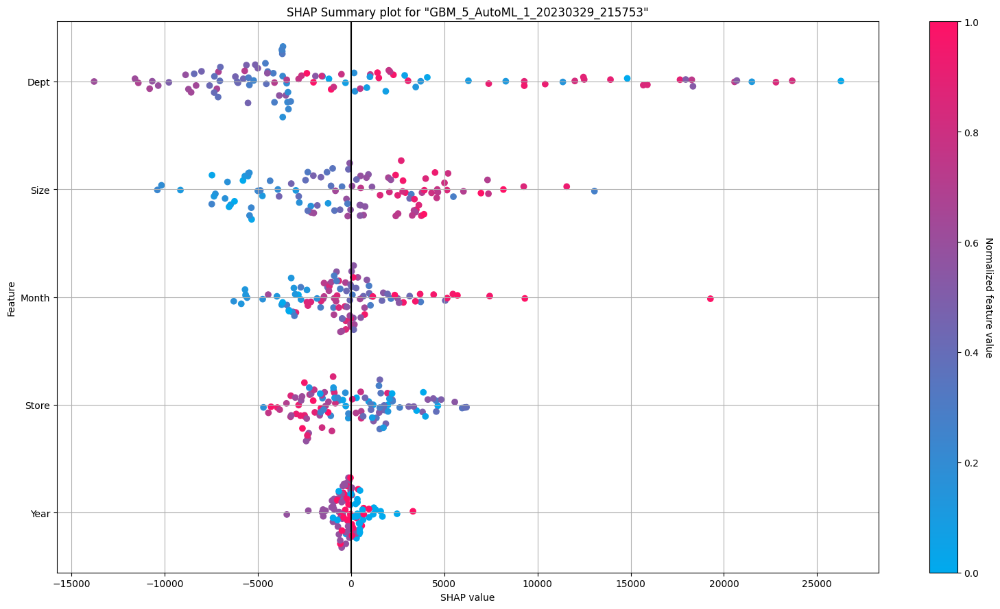

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

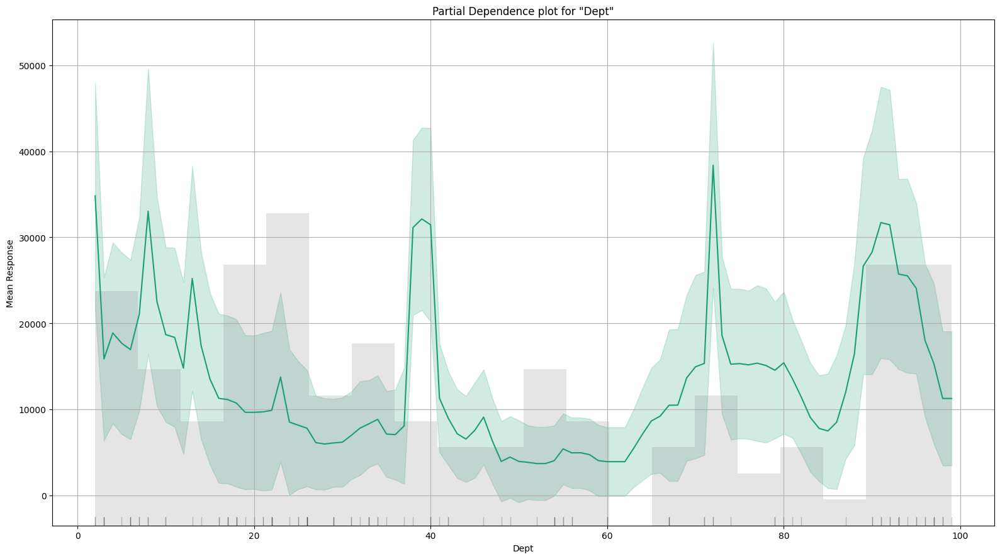

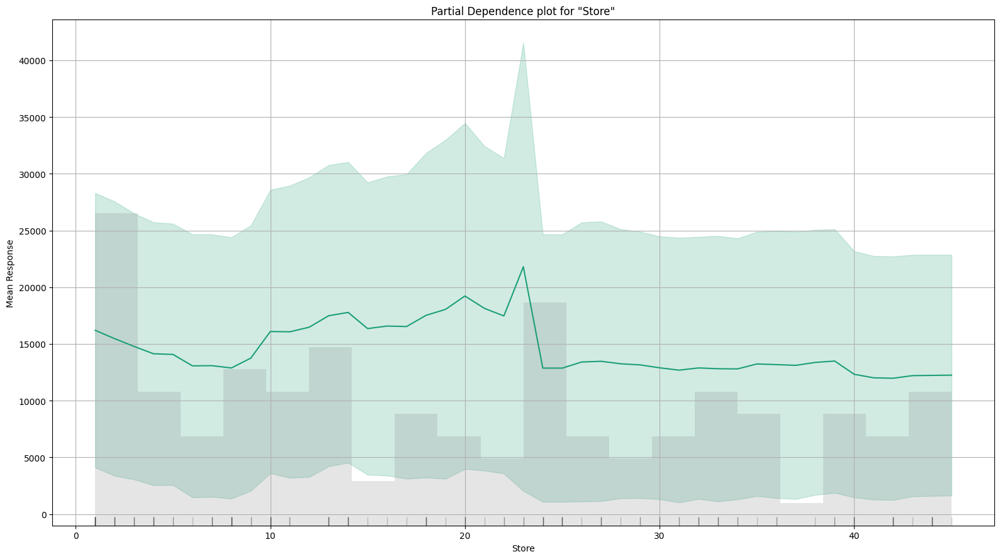

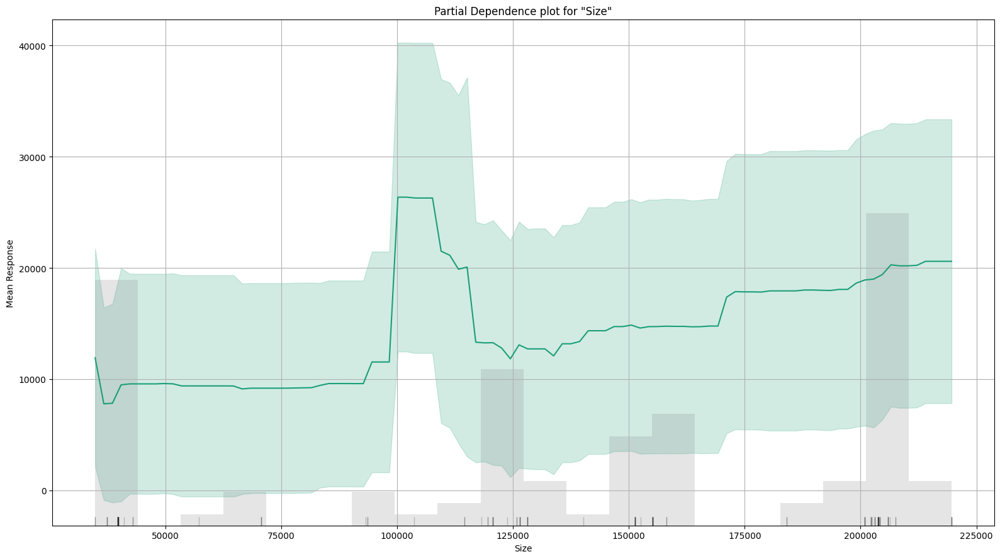

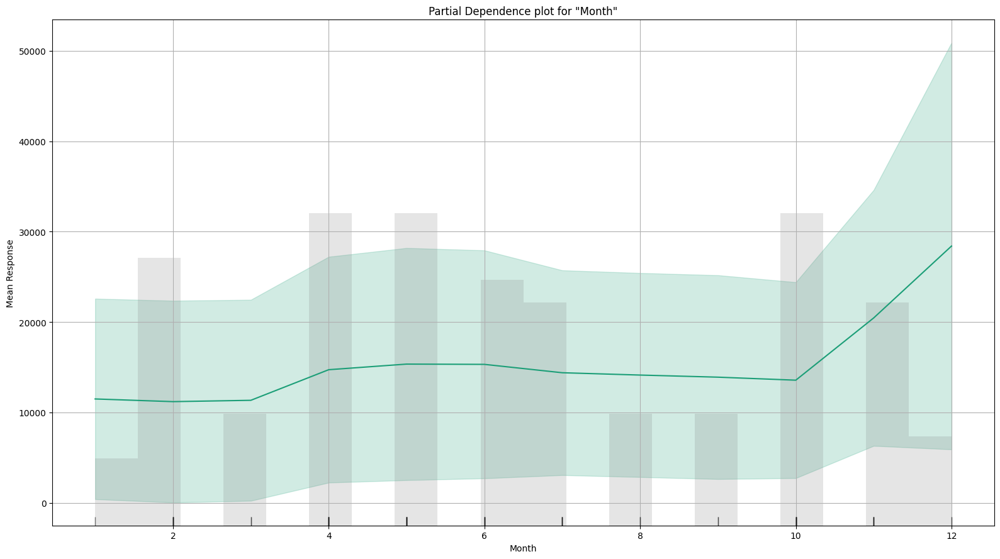

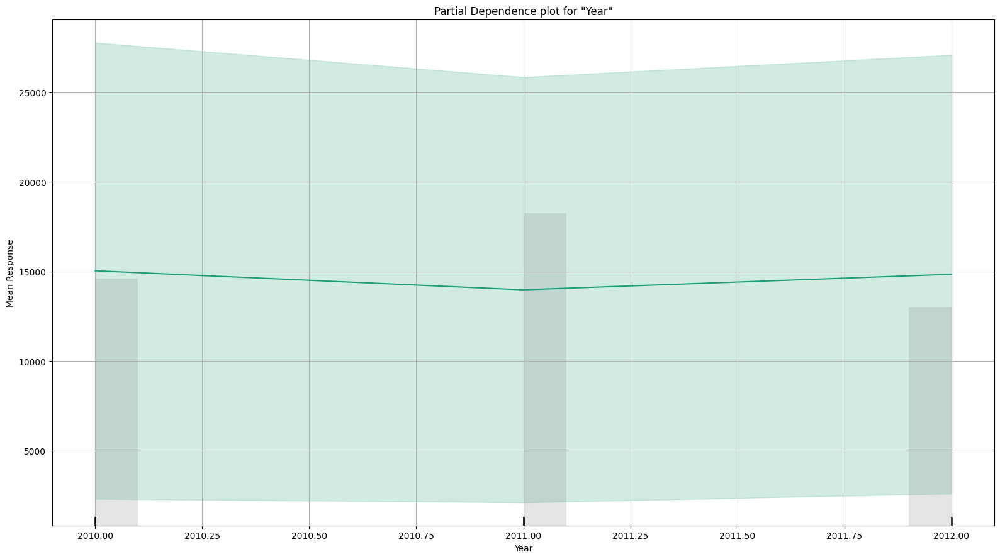

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

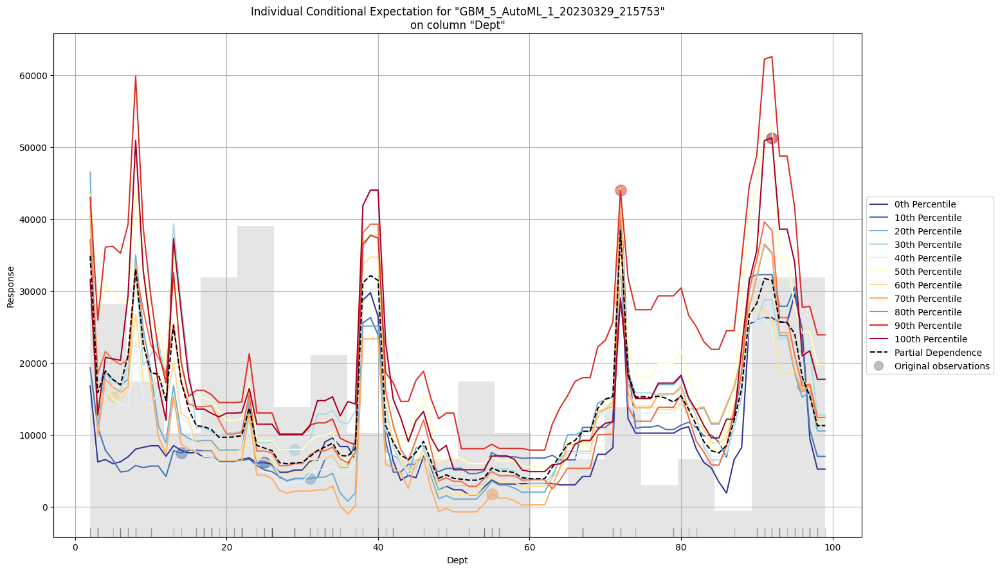

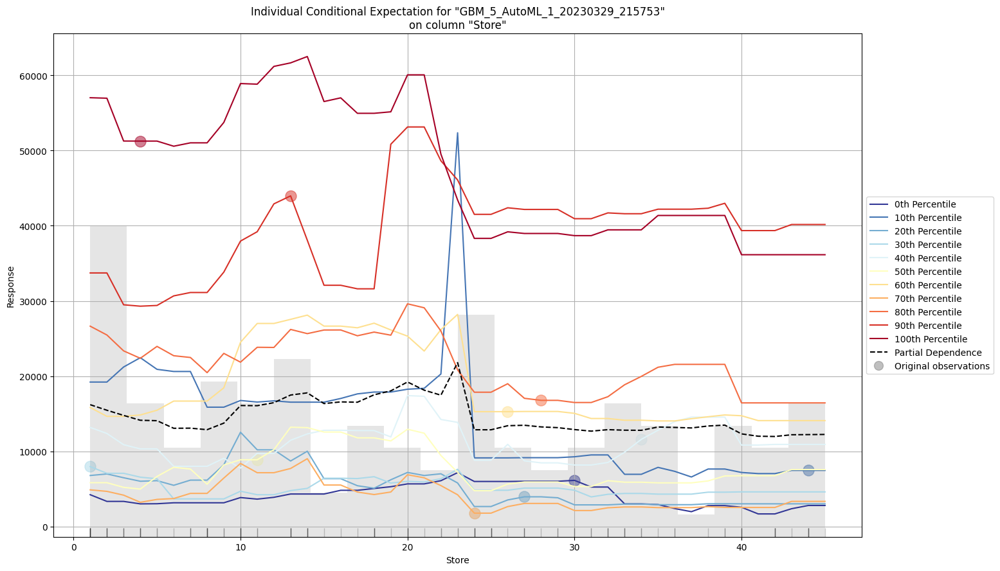

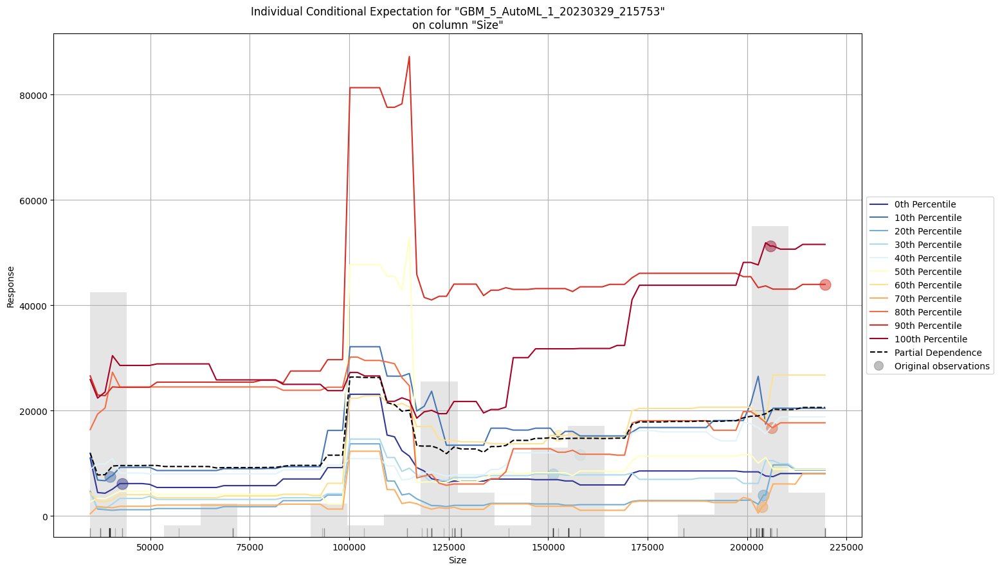

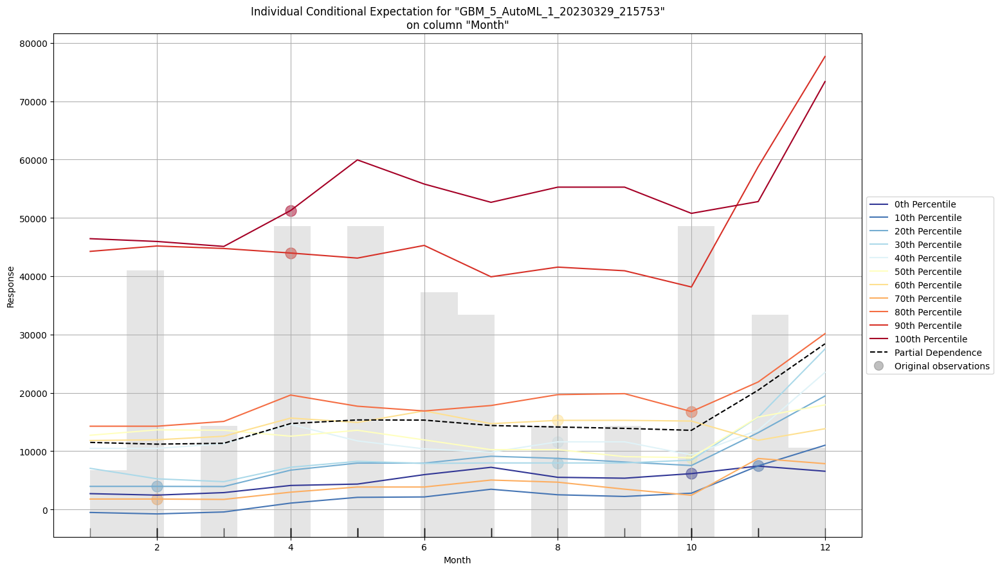

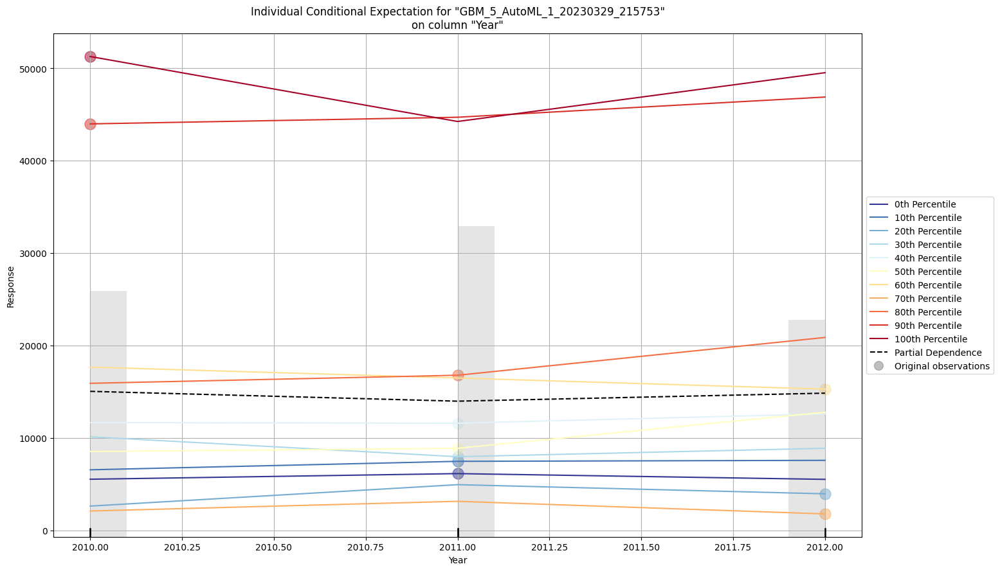

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [86]:
autoML_model.explain(autoML[1])

### Shap analysis of Linear Regression 

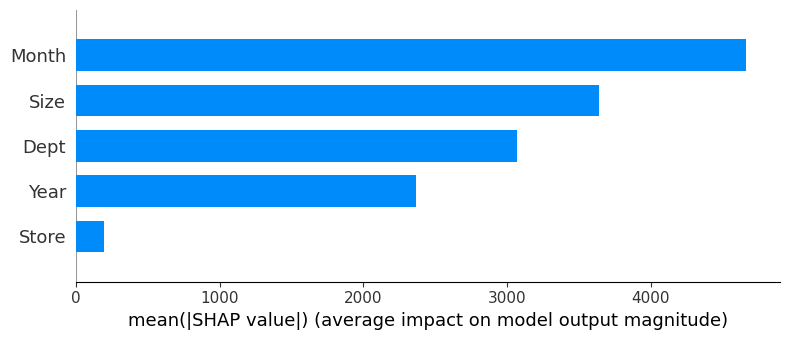

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


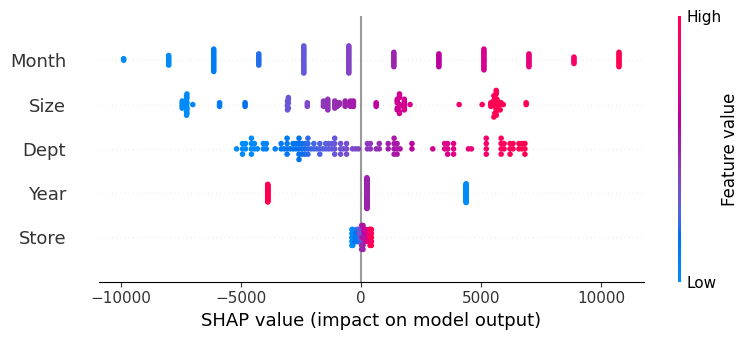

Waterfall plot for linear regression


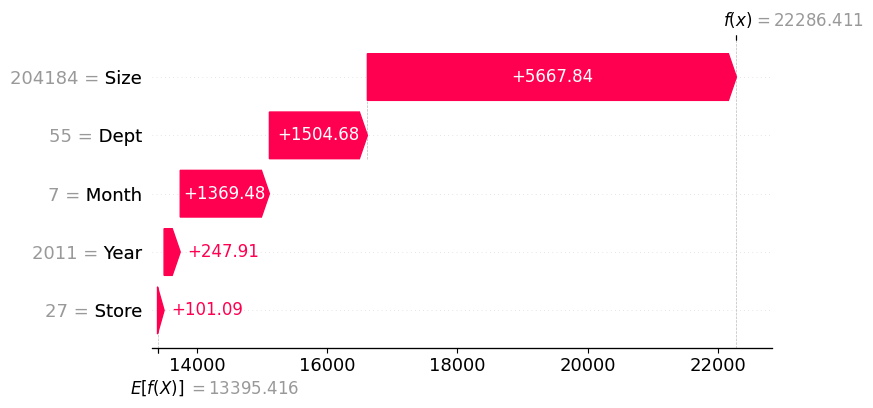

In [87]:
linear_explainer_shap = shap.Explainer(regr.predict, x_train)
shap_values_linear_regression = linear_explainer_shap(x_train)
shap.summary_plot(shap_values_linear_regression, x_train, plot_type = 'bar', max_display=14)
shap.summary_plot(shap_values_linear_regression, x_train, max_display = 14)

print("Waterfall plot for linear regression")
shap.plots.waterfall(shap_values_linear_regression[30], max_display = 14)

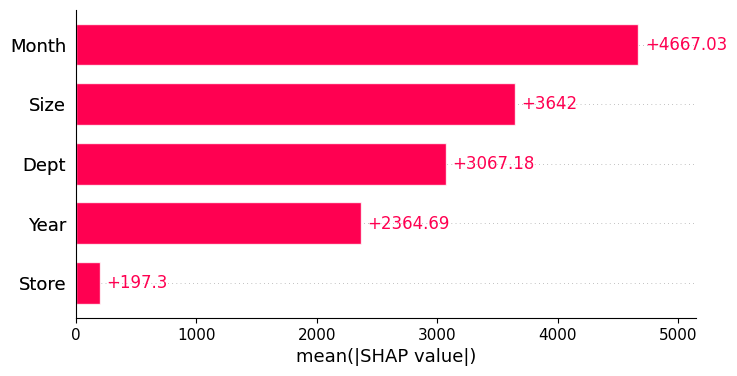

In [88]:
shap.plots.bar(shap_values_linear_regression)

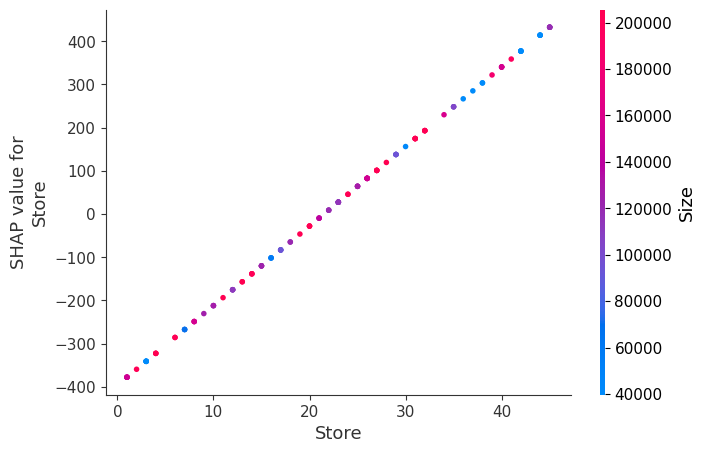

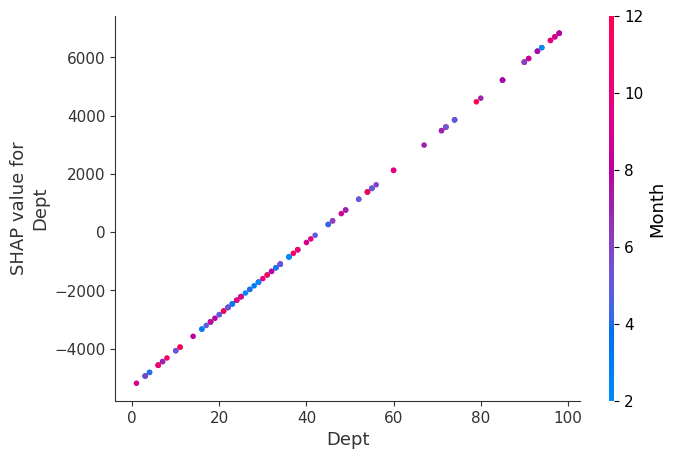

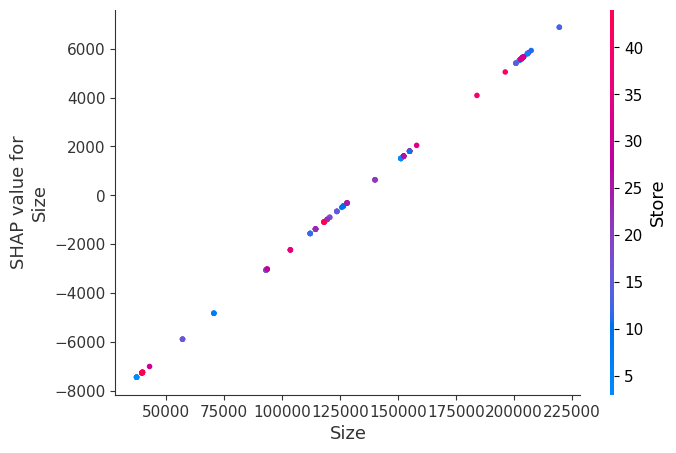

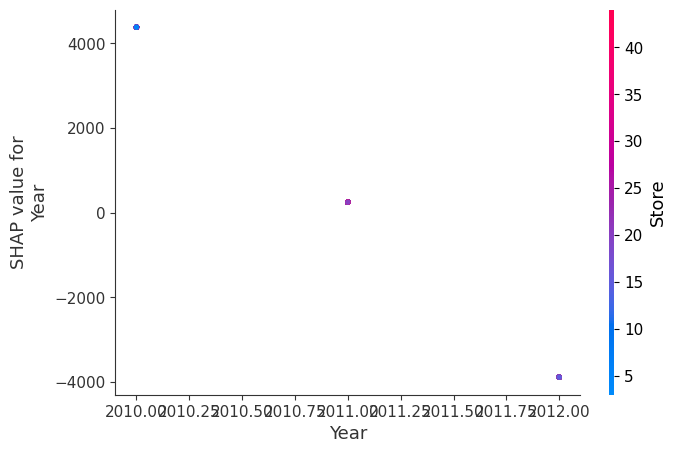

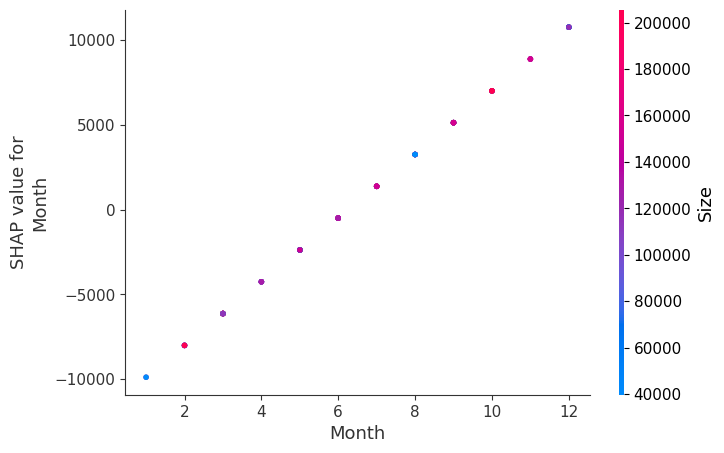

In [89]:
for i in x_train.columns:
  shap.dependence_plot(i, shap_values_linear_regression.values, x_train)

#Heatmap of the shap values for the linear regression model

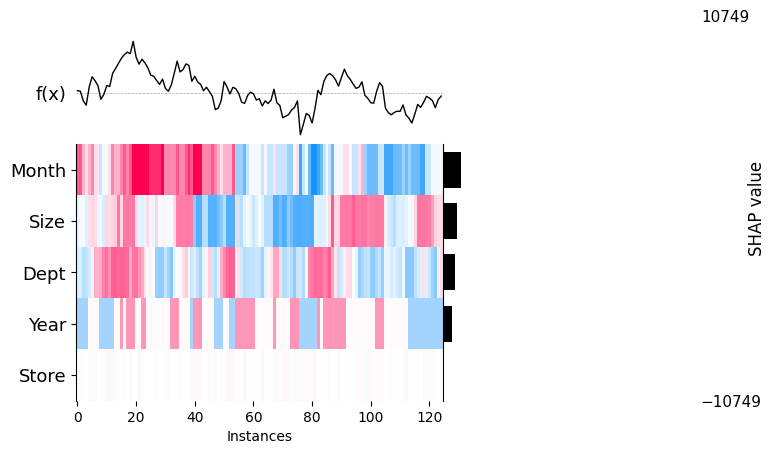

In [90]:
shap.plots.heatmap(shap_values_linear_regression)

### Shap analysis (For decision tree)

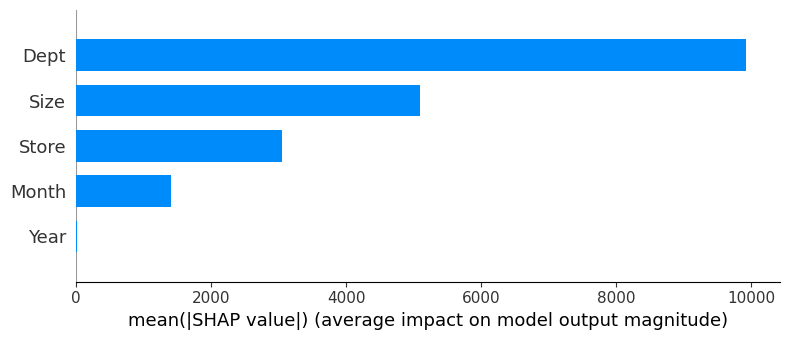

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


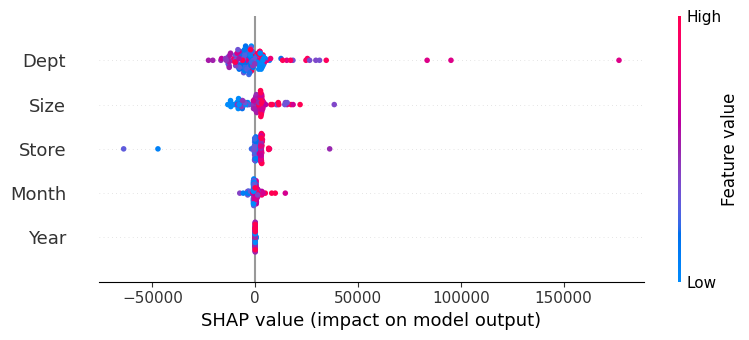

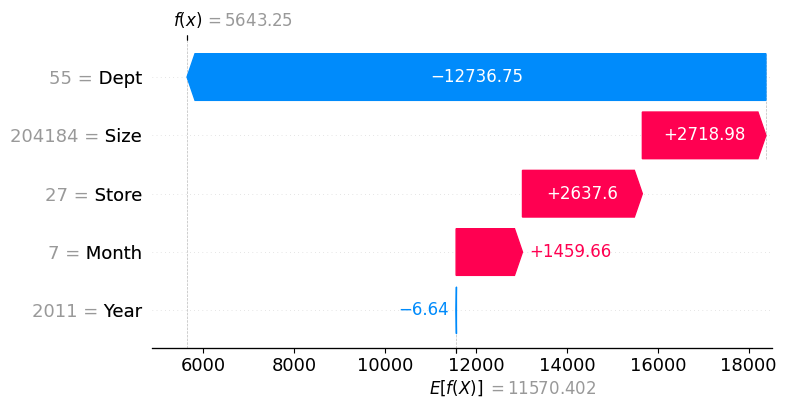

In [91]:
explainer = shap.Explainer(regressor.predict, x_train)
shap_values_decision_tree = explainer(x_train)
shap.summary_plot(shap_values_decision_tree, x_train, plot_type="bar")
shap.summary_plot(shap_values_decision_tree, x_train)
shap.plots.waterfall(shap_values_decision_tree[30], max_display=15)

### Shap importance plot

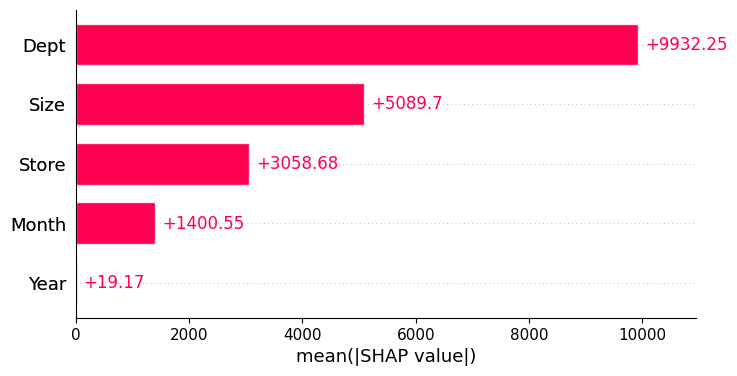

In [92]:
shap.plots.bar(shap_values_decision_tree)

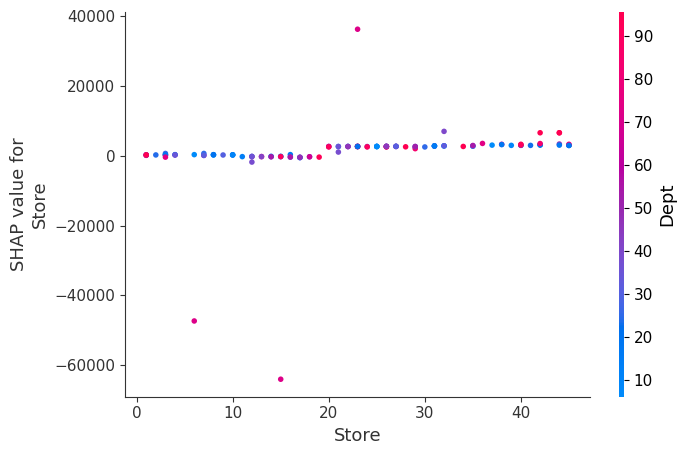

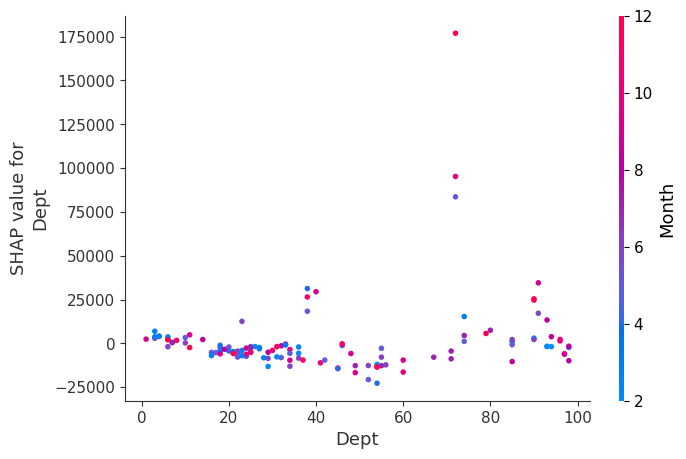

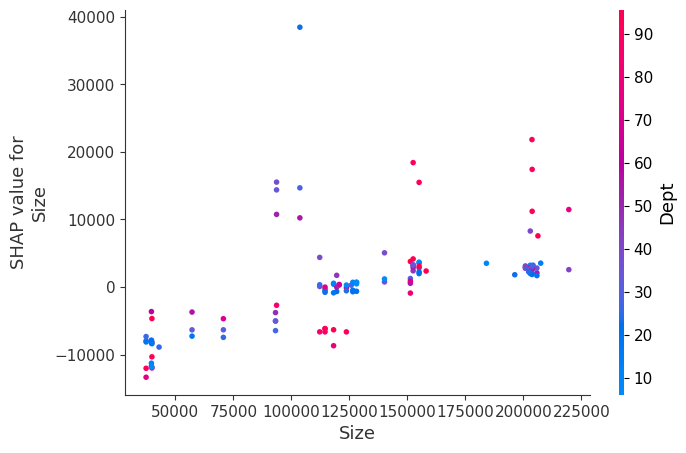

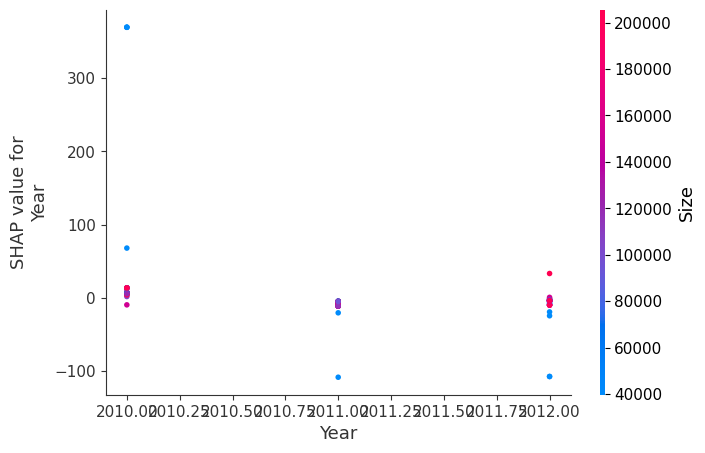

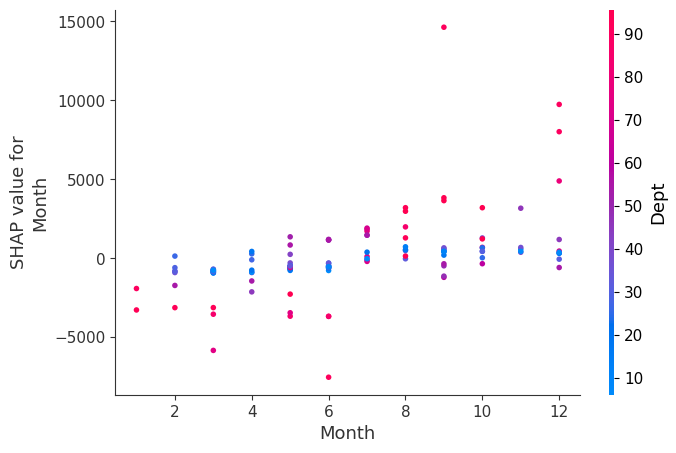

In [93]:
for i in x_train.columns:
  shap.dependence_plot(i, shap_values_decision_tree.values, x_train)

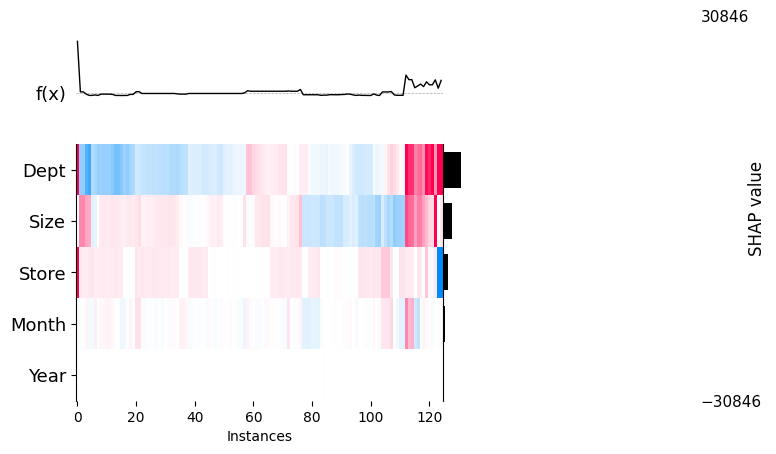

In [94]:
shap.plots.heatmap(shap_values_decision_tree)

#PDP(Partial Dependence Plot) for Linear model and Tree-based Model
Linear Model -
If we closely look at the PDP of the linear model we can see that if features volatile_acidity, sulfates, alcohol are tuned while freezing the rest if them the output of the model varies linearly and these variables have the most significant effect on the output(quality of wine) 2. Tree-Based Model - On looking at the PDP of the tree-based model, it re-affirms the interpretation we got from the PDP of the Linear Model and Best AutoML model. The only difference here is that the output doesn't vary linearly

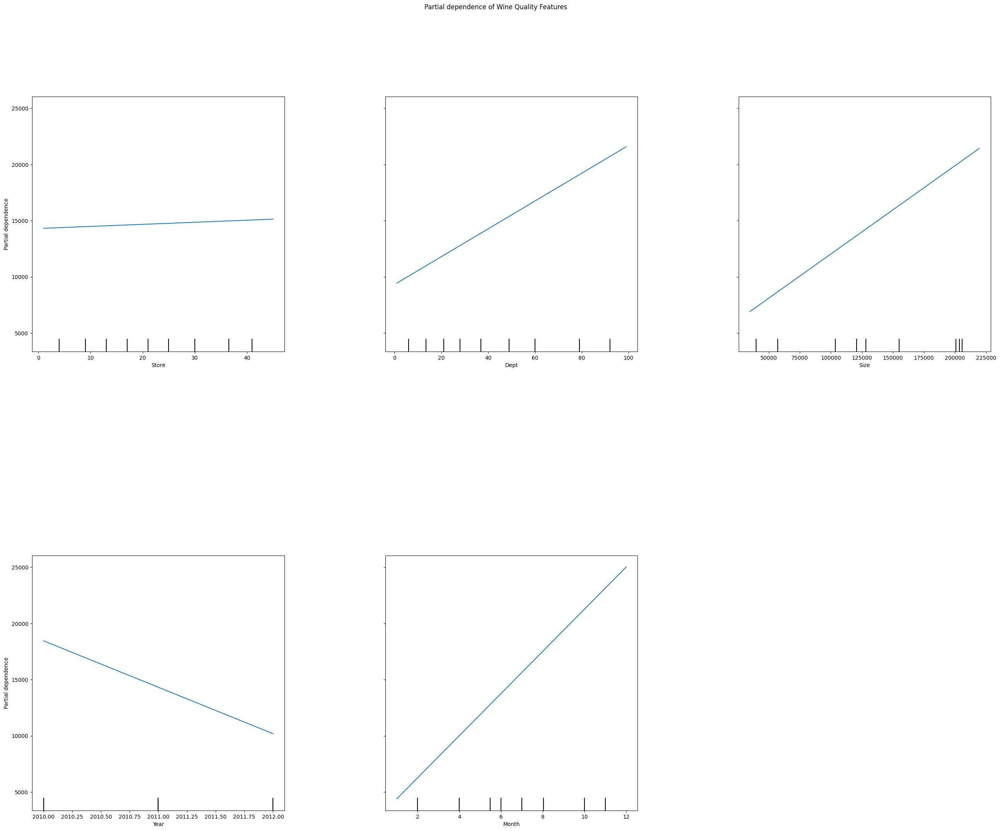

In [97]:
# PDP Plot for Linear Model
# PartialDependenceDisplay(
#     linear_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20
# )

PartialDependenceDisplay.from_estimator(regr, x_test, x_test.columns )

fig = plt.gcf()
fig.suptitle("Partial dependence of Wine Quality Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)
     

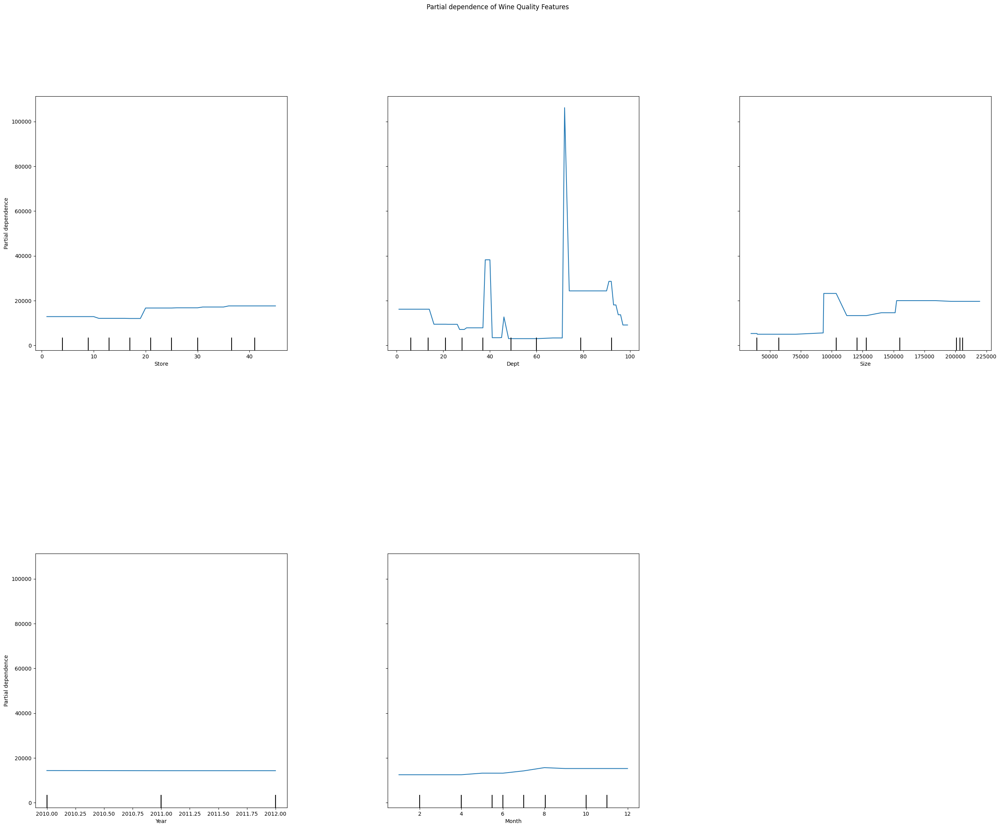

In [99]:
# PDP Plot for Tree based Model
# PartialDependenceDisplay(
#     tree_model, x_test, x_test.columns, n_jobs=3, grid_resolution=20
# )
PartialDependenceDisplay.from_estimator(regressor, x_test, x_test.columns )

fig = plt.gcf()
fig.suptitle("Partial dependence of Wine Quality Features")
fig.subplots_adjust(wspace=0.4, hspace=0.8)
plt.show()
plt.rcParams["figure.figsize"] = (32, 24)

## Lime analysis


In [100]:
from lime import lime_tabular
explainer_regression_model = lime_tabular.LimeTabularExplainer(training_data=np.array(x_train), feature_names=x_train.columns, class_names=['JobSatisfaction'], mode='regression')

exp = explainer_regression_model.explain_instance(x_test.values[0], regr.predict)
exp.show_in_notebook(show_table=True)

exp = explainer_regression_model.explain_instance(x_test.values[10], regr.predict)
exp.show_in_notebook(show_table=True)

exp = explainer_regression_model.explain_instance(x_test.values[5], regr.predict)
exp.show_in_notebook(show_table=True)

exp = explainer_regression_model.explain_instance(x_test.values[2], regr.predict)
exp.show_in_notebook(show_table=True)

X does not have valid feature names, but LinearRegression was fitted with feature names


X does not have valid feature names, but LinearRegression was fitted with feature names


X does not have valid feature names, but LinearRegression was fitted with feature names


X does not have valid feature names, but LinearRegression was fitted with feature names


#Comparision between SHAP, LIME, and Partial Dependence Plot Analysis
Unlike LIME, SHAP does not necessarily build a local interpretable model but rather uses the black-box model to calculate the marginal contribution to the prediction for each feature and then relies on the theoretically sound game theory concept of Shapley values to calculate the feature importance. In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

PDP gives the extent of effect a variable has on the output by freezing the rest of them
SHAP gives how much each variable contributes to the prediction
LIME is more like SHAP but a lite version of it - It takes the local region of the point of interest and gives us information about the contribution each variable has made to the output
We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

#References
Molnar, C. (2022). Interpretable Machine Learning: A Guide for Making Black Box Models Explainable (2nd ed.)
christophm.github.io/interpretable-ml-book/

https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d
https://medium.com/@kalia_65609/interpreting-an-nlp-model-with-lime-and-shap-834ccfa124e4#:~:text=Unlike%20LIME%2C%20SHAP%20does%20not,to%20calculate%20the%20feature%20importance.
https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb